# Action Recognition

Задача распознавания действий (Action Recognition) в области машинного обучения заключается в определении и классификации действий, выполняемых объектами или субъектами на основе входных данных, таких как видео, аудио или сенсорные данные. Эта задача имеет широкий спектр применений, включая распознавание жестов, деятельности человека, действий в рамках медицинских и спортивных исследований, а также в области видеонаблюдения и робототехники.

Основной целью задачи распознавания действий является классификация или сегментация последовательности действий во времени. Для этого часто используются различные методы машинного обучения, включая глубокое обучение, рекуррентные нейронные сети (RNN), сверточные нейронные сети (CNN), рекуррентные сверточные нейронные сети (RCNN) и их комбинации, такие как LSTM (Long Short-Term Memory) и GRU (Gated Recurrent Unit).

Примеры задач распознавания действий включают определение спортивных активностей (например, бег, ходьба, плавание), анализ поведения в видеонаблюдении (например, обнаружение аномального поведения), управление роботами на основе жестов или действий оператора, а также автоматический анализ клипов из фильмов или видео-блогов для создания метаинформации или рекомендаций.

Действие - это некоторое событие которое можно отметить на видео обладая
априорным знанием что оно может там произойти. Событие может быть произведено
человеком, машиной, животным или чем-то другим. Распознавание действий в
большинстве случаев используется для какого-нибудь детерминированного процесса.

Такое определение уместно для реальных задач ComputerVision, но не очень хорошо
для академических задач, где требуется ''универсальное определение''. Так же оно
не работает для всяких видео стримингов и система анализа контента.

Реальные задачи обычно имеют ограниченный набор данных/ракурсов, формата -
например:

* Контроль выполнения действий на производстве
* Контроль покупателей/сотрудников магазинов
* Контроль выполнения правильного порядка действий на кухне
* Контроль поведения с камеры висящей на голове/на теле (спортсмены, полиция,
  и.т.д.)
* Детектор аварий
* и.т.д.

## Использование CNN + LSTM для Action Recognition (видео данные)

### Описание датасета и инициализация

UCF50 - это набор данных по распознаванию действий с 50 категориями действий, состоящий из реалистичных видеороликов, взятых с YouTube. Этот набор данных является расширением набора данных по действиям на YouTube (UCF11), который включает в себя 11 категорий действий.

Большинство доступных наборов данных по распознаванию действий являются нереалистичными и постановочными, с участием актеров. В нашем наборе данных основное внимание уделяется предоставлению сообществу компьютерного зрения набора данных по распознаванию действий, состоящего из реалистичных видеороликов, взятых с YouTube. Наш набор данных очень сложен из-за больших вариаций в движении камеры, внешнем виде и позе объектов, масштабе объектов, точке зрения, зашумленном фоне, условиях освещения и т. д. Для всех 50 категорий видеоролики группируются в 25 групп, где каждая группа состоит из более чем 4 видеоклипов с действиями. Видеоклипы в одной группе могут иметь некоторые общие характеристики, такие как один и тот же человек, схожий фон, похожая точка зрения и так далее.

In [1]:
%pip install tensorflow opencv-contrib-python youtube-dl moviepy pydot
%pip install git+https://github.com/TahaAnwar/pafy.git#egg=pafy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 388.3/388.3 kB 61.5 kB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.3/68.3 MB 61.8 kB/s eta 0:00:0000:0100:28
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 62.1 kB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.9/26.9 MB 61.8 kB/s eta 0:00:0000:0100:11
  Created wheel for moviepy: filename=moviepy-1.0.3-py3-none-any.whl size=110721 sha256=854d2e78cbf04e8fe08ef2d973e0201b27b2cac15129d1d9a86be615153064f6
  Stored in directory: /home/student1/.cache/pip/wheels/29/15/e4/4f790bec6acd51a00b67e8ee1394f0bc6e0135c315f8ff399a
Successfully built moviepy
  Attempting uninstall: decorator
    Found existing installation: decorator 5.1.1
    Uninstalling decorator-5.1.1:
      Successfully uninstalled decorator-5.1.1
Note: you may need to restart the kernel to use updated packages.
  Cloning https://github.com/TahaAnwar/pafy.git to /tmp/pip-install-ix7i1cc2/p

In [1]:
# Discard the output of this cell.
#%%capture


# Import the required libraries.
import os
import cv2
import pafy
import math
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt

from moviepy.editor import *
%matplotlib inline

from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

2024-04-25 21:47:17.798272: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-25 21:47:17.820564: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-25 21:47:17.820585: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-25 21:47:17.821192: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-25 21:47:17.825390: I tensorflow/core/platform/cpu_feature_guar

[11, 34, 34, 18, 10, 18, 6, 1, 27, 38, 40, 21, 16, 45, 16, 49, 45, 1, 17, 29]
[11, 34, 34, 18, 10, 18, 6, 1, 27, 38, 40, 21, 16, 45, 16, 49, 45, 1, 17, 29]
[11, 34, 34, 18, 10, 18, 6, 1, 27, 38, 40, 21, 16, 45, 16, 49, 45, 1, 17, 29]
[11, 34, 34, 18, 10, 18, 6, 1, 27, 38, 40, 21, 16, 45, 16, 49, 45, 1, 17, 29]
[11, 34, 34, 18, 10, 18, 6, 1, 27, 38, 40, 21, 16, 45, 16, 49, 45, 1, 17, 29]
[11, 34, 34, 18, 10, 18, 6, 1, 27, 38, 40, 21, 16, 45, 16, 49, 45, 1, 17, 29]
[11, 34, 34, 18, 10, 18, 6, 1, 27, 38, 40, 21, 16, 45, 16, 49, 45, 1, 17, 29]
[11, 34, 34, 18, 10, 18, 6, 1, 27, 38, 40, 21, 16, 45, 16, 49, 45, 1, 17, 29]
[11, 34, 34, 18, 10, 18, 6, 1, 27, 38, 40, 21, 16, 45, 16, 49, 45, 1, 17, 29]
[11, 34, 34, 18, 10, 18, 6, 1, 27, 38, 40, 21, 16, 45, 16, 49, 45, 1, 17, 29]
[11, 34, 34, 18, 10, 18, 6, 1, 27, 38, 40, 21, 16, 45, 16, 49, 45, 1, 17, 29]
[11, 34, 34, 18, 10, 18, 6, 1, 27, 38, 40, 21, 16, 45, 16, 49, 45, 1, 17, 29]
[11, 34, 34, 18, 10, 18, 6, 1, 27, 38, 40, 21, 16, 45, 16, 49, 4

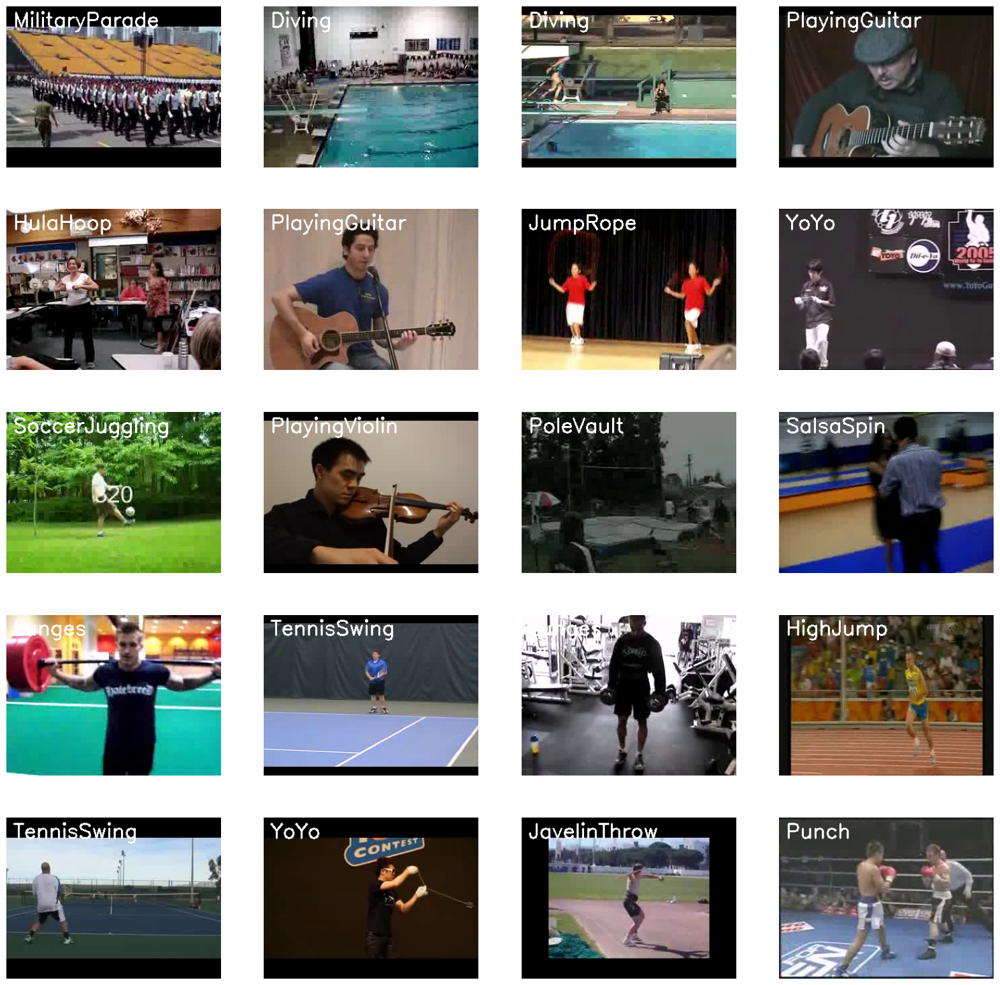

In [2]:
# Create a Matplotlib figure and specify the size of the figure.
plt.figure(figsize = (20, 20))


# Get the names of all classes/categories in UCF50.
all_classes_names = os.listdir('dataset/UCF50/')

# Generate a list of 20 random values. The values will be between 0-50,
# where 50 is the total number of class in the dataset.
random_range = random.sample(range(len(all_classes_names)), 20)
random_range = [random.randint(0, len(all_classes_names)) for _ in range(20)]

# Iterating through all the generated random values.
for counter, random_index in enumerate(random_range, 1):

    print(random_range)
    # Retrieve a Class Name using the Random Index.
    selected_class_Name = all_classes_names[random_index]

    # Retrieve the list of all the video files present in the randomly selected Class Directory.
    video_files_names_list = os.listdir(f'dataset/UCF50/{selected_class_Name}')

    # Randomly select a video file from the list retrieved from the randomly selected Class Directory.
    selected_video_file_name = random.choice(video_files_names_list)

    # Initialize a VideoCapture object to read from the video File.
    video_reader = cv2.VideoCapture(f'dataset/UCF50/{selected_class_Name}/{selected_video_file_name}')

    # Read the first frame of the video file.
    _, bgr_frame = video_reader.read()

    # Release the VideoCapture object.
    video_reader.release()

    # Convert the frame from BGR into RGB format.
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)

    # Write the class name on the video frame.
    cv2.putText(rgb_frame, selected_class_Name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

    # Display the frame.
    plt.subplot(5, 4, counter);plt.imshow(rgb_frame);plt.axis('off')

### Препроцессинг данных

In [3]:
# Specify the height and width to which each video frame will be resized in our dataset.
IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64

# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 20

# Specify the directory containing the UCF50 dataset.
DATASET_DIR = "dataset/UCF50"

# Specify the list containing the names of the classes used for training. Feel free to choose any set of classes.
CLASSES_LIST = ["WalkingWithDog", "TaiChi", "Swing", "HorseRace"]

In [4]:
def frames_extraction(video_path):
    '''
    This function will extract the required frames from a video after resizing and normalizing them.
    Args:
        video_path: The path of the video in the disk, whose frames are to be extracted.
    Returns:
        frames_list: A list containing the resized and normalized frames of the video.
    '''

    # Declare a list to store video frames.
    frames_list = []

    # Read the Video File using the VideoCapture object.
    video_reader = cv2.VideoCapture(video_path)

    # Get the total number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

    # Iterate through the Video Frames.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Reading the frame from the video.
        success, frame = video_reader.read()

        # Check if Video frame is not successfully read then break the loop
        if not success:
            break

        # Resize the Frame to fixed height and width.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalized_frame = resized_frame / 255

        # Append the normalized frame into the frames list
        frames_list.append(normalized_frame)

    # Release the VideoCapture object.
    video_reader.release()

    # Return the frames list.
    return frames_list

In [5]:
def create_dataset():
    '''
    This function will extract the data of the selected classes and create the required dataset.
    Returns:
        features:          A list containing the extracted frames of the videos.
        labels:            A list containing the indexes of the classes associated with the videos.
        video_files_paths: A list containing the paths of the videos in the disk.
    '''

    # Declared Empty Lists to store the features, labels and video file path values.
    features = []
    labels = []
    video_files_paths = []

    # Iterating through all the classes mentioned in the classes list
    for class_index, class_name in enumerate(CLASSES_LIST):

        # Display the name of the class whose data is being extracted.
        print(f'Extracting Data of Class: {class_name}')

        # Get the list of video files present in the specific class name directory.
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))

        # Iterate through all the files present in the files list.
        for file_name in files_list:

            # Get the complete video path.
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)

            # Extract the frames of the video file.
            frames = frames_extraction(video_file_path)

            # Check if the extracted frames are equal to the SEQUENCE_LENGTH specified above.
            # So ignore the vides having frames less than the SEQUENCE_LENGTH.
            if len(frames) == SEQUENCE_LENGTH:

                # Append the data to their repective lists.
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)

    # Converting the list to numpy arrays
    features = np.asarray(features)
    labels = np.array(labels)

    # Return the frames, class index, and video file path.
    return features, labels, video_files_paths

In [6]:
# Create the dataset.
features, labels, video_files_paths = create_dataset()

Extracting Data of Class: WalkingWithDog
Extracting Data of Class: TaiChi
Extracting Data of Class: Swing
Extracting Data of Class: HorseRace


In [7]:
# Using Keras's to_categorical method to convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)

In [8]:
# Split the Data into Train ( 75% ) and Test Set ( 25% ).
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels,
                                                                            test_size = 0.25, shuffle = True)

### Подход 1: ConvLSTM

На этом этапе мы реализуем первый подход, используя комбинацию ячеек ConvLSTM. Ячейка ConvLSTM - это вариант сети LSTM, который содержит операции свертки в сети. Это LSTM с встроенными свертками в архитектуру, что делает его способным идентифицировать пространственные особенности данных, учитывая временные отношения.

<center>
<img src="https://drive.google.com/uc?export=view&id=1KHN_JFWJoJi1xQj_bRdxy2QgevGOH1qP" width= 500px>
</center>


Для классификации видео этот подход эффективно улавливает пространственные отношения в отдельных кадрах и временные отношения между разными кадрами. В результате такой структуры свертки, ConvLSTM способен обрабатывать трехмерный вход `(ширина, высота, количество каналов)`, в то время как простая LSTM принимает только одномерный вход, поэтому LSTM несовместим с моделированием пространственно-временных данных сам по себе.

In [9]:
def create_convlstm_model():
    '''
    This function will construct the required convlstm model.
    Returns:
        model: It is the required constructed convlstm model.
    '''

    # We will use a Sequential model for model construction
    model = Sequential()

    # Define the Model Architecture.
    ########################################################################################################################

    model.add(ConvLSTM2D(filters = 4, kernel_size = (3, 3), activation = 'tanh',data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True, input_shape = (SEQUENCE_LENGTH,
                                                                                      IMAGE_HEIGHT, IMAGE_WIDTH, 3)))

    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters = 8, kernel_size = (3, 3), activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True))

    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters = 14, kernel_size = (3, 3), activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True))

    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters = 16, kernel_size = (3, 3), activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True))

    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    #model.add(TimeDistributed(Dropout(0.2)))

    model.add(Flatten())

    model.add(Dense(len(CLASSES_LIST), activation = "softmax"))

    ########################################################################################################################

    # Display the models summary.
    model.summary()

    # Return the constructed convlstm model.
    return model

In [10]:
# Construct the required convlstm model.
convlstm_model = create_convlstm_model()

# Display the success message.
print("Model Created Successfully!")

2024-04-25 19:11:52.465913: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-25 19:11:52.483210: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d (ConvLSTM2D)        │ (None, 20, 62, 62, 4)  │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d (MaxPooling3D)    │ (None, 20, 31, 31, 4)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed                │ (None, 20, 31, 31, 4)  │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_lstm2d_1 (ConvLSTM2D)      │ (None, 20, 29, 29, 8)  │         3,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_1 (MaxPooling3D)  │ (None, 20, 15, 15, 8)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_1              │ (None, 20, 15, 15, 8)  │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_lstm2d_2 (ConvLSTM2D)      │ (None, 20, 13, 13, 14) │        11,144 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_2 (MaxPooling3D)  │ (None, 20, 7, 7, 14)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_2              │ (None, 20, 7, 7, 14)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_lstm2d_3 (ConvLSTM2D)      │ (None, 20, 5, 5, 16)   │        17,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_3 (MaxPooling3D)  │ (None, 20, 3, 3, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2880)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4)              │        11,524 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 44,524 (173.92 KB)

 Trainable params: 44,524 (173.92 KB)

 Non-trainable params: 0 (0.00 B)

Model Created Successfully!


In [13]:
%pip install graphviz

Note: you may need to restart the kernel to use updated packages.


In [11]:
# Plot the structure of the contructed model.
plot_model(convlstm_model, to_file = 'convlstm_model_structure_plot.png', show_shapes = True, show_layer_names = True)

You must install graphviz (see instructions at https://graphviz.gitlab.io/download/) for `plot_model` to work.


In [24]:
# Create an Instance of Early Stopping Callback
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 10, mode = 'min', restore_best_weights = True)

# Compile the model and specify loss function, optimizer and metrics values to the model
convlstm_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

# Start training the model.
convlstm_model_training_history = convlstm_model.fit(x = features_train, y = labels_train, epochs = 50, batch_size = 4,
                                                     shuffle = True, validation_split = 0.2,
                                                     callbacks = [early_stopping_callback])

Epoch 1/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - accuracy: 0.2983 - loss: 1.3702 - val_accuracy: 0.4247 - val_loss: 1.3021
Epoch 2/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step - accuracy: 0.4668 - loss: 1.2501 - val_accuracy: 0.5890 - val_loss: 1.1408
Epoch 3/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.6280 - loss: 0.9772 - val_accuracy: 0.4658 - val_loss: 1.3048
Epoch 4/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7117 - loss: 0.8482 - val_accuracy: 0.5616 - val_loss: 1.0062
Epoch 5/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step - accuracy: 0.7645 - loss: 0.6511 - val_accuracy: 0.5616 - val_loss: 1.0961
Epoch 6/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step - accuracy: 0.7967 - loss: 0.5490 - val_accuracy: 0.6301 - val_loss: 0.9881
Epoch 7/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8006 - loss: 0.4447 - val_accuracy: 0.6164 - val_loss: 1.1756
Epoch 8/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step - accuracy: 0.8805 - loss: 0.2925 - val_accuracy: 0.6849 - v

In [25]:
# Evaluate the trained model.
model_evaluation_history = convlstm_model.evaluate(features_test, labels_test)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.5908 - loss: 1.0205


In [26]:
# Get the loss and accuracy from model_evaluation_history.
model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history

# Define the string date format.
# Get the current Date and Time in a DateTime Object.
# Convert the DateTime object to string according to the style mentioned in date_time_format string.
date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)

# Define a useful name for our model to make it easy for us while navigating through multiple saved models.
model_file_name = f'convlstm_model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'

# Save your Model.
convlstm_model.save(model_file_name)

#### Метрики

In [27]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    '''
    This function will plot the metrics passed to it in a graph.
    Args:
        model_training_history: A history object containing a record of training and validation
                                loss values and metrics values at successive epochs
        metric_name_1:          The name of the first metric that needs to be plotted in the graph.
        metric_name_2:          The name of the second metric that needs to be plotted in the graph.
        plot_name:              The title of the graph.
    '''

    # Get metric values using metric names as identifiers.
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]

    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metric_value_1))

    # Plot the Graph.
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)

    # Add title to the plot.
    plt.title(str(plot_name))

    # Add legend to the plot.
    plt.legend()

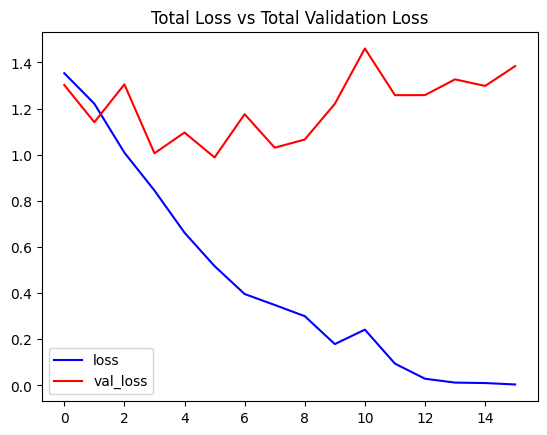

In [28]:
# Visualize the training and validation loss metrices.
plot_metric(convlstm_model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

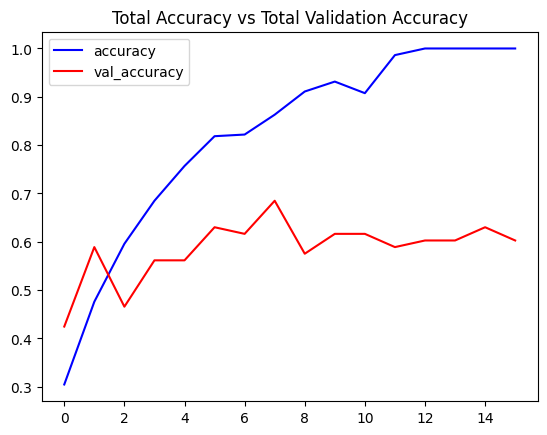

In [29]:
# Visualize the training and validation accuracy metrices.
plot_metric(convlstm_model_training_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

### Подход 2: LRCN


На этом этапе мы реализуем подход LRCN (Long-term Recurrent Convolutional Network), объединяющий слои свертки и LSTM в одну модель. Другой похожий подход может быть использование отдельно обученных моделей CNN и LSTM. Модель CNN может использоваться для извлечения пространственных особенностей из кадров видео, а для этой цели может использоваться предварительно обученная модель, которая может быть дообучена для решения конкретной задачи. Затем модель LSTM может использовать извлеченные признаки CNN для предсказания действий, выполняемых в видео.

Однако здесь мы реализуем другой подход, известный как Long-term Recurrent Convolutional Network (LRCN), который объединяет слои CNN и LSTM в одну модель. Слой свертки используется для извлечения пространственных признаков из кадров, а извлеченные пространственные признаки подаются на вход слоев LSTM на каждом временном шаге для моделирования временных последовательностей. Таким образом, сеть изучает пространственно-временные признаки непосредственно в процессе обучения на конечном этапе, что позволяет получить надежную модель.

<center>
<img src='https://drive.google.com/uc?export=download&id=1I-q5yLsIoNh2chfzT7JYvra17FsXvdme'>
</center>

Мы также будем использовать [**`TimeDistributed`**](https://keras.io/api/layers/recurrent_layers/time_distributed/) wrapper-слой, которая позволяет применять один и тот же слой к каждому кадру видео независимо. Таким образом, данный слой (вокруг которого он обернут) способен принимать входные данные формы `(количество_кадров, ширина, высота, количество_каналов)`, если исходная форма входных данных слоя была `(ширина, высота, количество_каналов)`, что очень полезно, поскольку это позволяет передавать всё видео в модель за один раз.

<center>
<img src='https://drive.google.com/uc?export=download&id=1CbauSm5XTY7ypHYBHH7rDSnJ5LO9CUWX' width=400>
</center>

In [12]:
def create_LRCN_model():
    '''
    This function will construct the required LRCN model.
    Returns:
        model: It is the required constructed LRCN model.
    '''

    # We will use a Sequential model for model construction.
    model = Sequential()

    # Define the Model Architecture.
    ########################################################################################################################

    model.add(TimeDistributed(Conv2D(16, (3, 3), padding='same',activation = 'relu'),
                              input_shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))

    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(32, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    #model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Flatten()))

    model.add(LSTM(32))

    model.add(Dense(len(CLASSES_LIST), activation = 'softmax'))

    ########################################################################################################################

    # Display the models summary.
    model.summary()

    # Return the constructed LRCN model.
    return model

In [13]:
# Construct the required LRCN model.
LRCN_model = create_LRCN_model()

# Display the success message.
print("Model Created Successfully!")

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ time_distributed_3              │ (None, 20, 64, 64, 16) │           448 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_4              │ (None, 20, 16, 16, 16) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_5              │ (None, 20, 16, 16, 16) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_6              │ (None, 20, 16, 16, 32) │         4,640 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_7              │ (None, 20, 4, 4, 32)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_8              │ (None, 20, 4, 4, 32)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_9              │ (None, 20, 4, 4, 64)   │        18,496 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_10             │ (None, 20, 2, 2, 64)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_11             │ (None, 20, 2, 2, 64)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_12             │ (None, 20, 2, 2, 64)   │        36,928 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_13             │ (None, 20, 1, 1, 64)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_14             │ (None, 20, 64)         │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           132 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 73,060 (285.39 KB)

 Trainable params: 73,060 (285.39 KB)

 Non-trainable params: 0 (0.00 B)

Model Created Successfully!


In [14]:
# Plot the structure of the contructed LRCN model.
plot_model(LRCN_model, to_file = 'LRCN_model_structure_plot.png', show_shapes = True, show_layer_names = True)

You must install graphviz (see instructions at https://graphviz.gitlab.io/download/) for `plot_model` to work.


In [33]:
# Create an Instance of Early Stopping Callback.
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 15, mode = 'min', restore_best_weights = True)

# Compile the model and specify loss function, optimizer and metrics to the model.
LRCN_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

# Start training the model.
LRCN_model_training_history = LRCN_model.fit(x = features_train, y = labels_train, epochs = 10, batch_size = 4 ,
                                             shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback])

Epoch 1/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - accuracy: 0.2616 - loss: 1.4136 - val_accuracy: 0.2466 - val_loss: 1.3802
Epoch 2/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.2806 - loss: 1.3795 - val_accuracy: 0.4384 - val_loss: 1.3251
Epoch 3/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.3886 - loss: 1.2547 - val_accuracy: 0.5890 - val_loss: 1.1361
Epoch 4/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5345 - loss: 1.0785 - val_accuracy: 0.4658 - val_loss: 1.2163
Epoch 5/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5962 - loss: 0.9417 - val_accuracy: 0.6164 - val_loss: 0.9194
Epoch 6/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.7411 - loss: 0.7341 - val_accuracy: 0.6575 - val_loss: 0.8809
Epoch 7/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.7296 - loss: 0.6901 - val_accuracy: 0.7123 - val_loss: 0.7193
Epoch 8/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.7632 - loss: 0.6263 - val_accuracy: 0.6849 - 

In [34]:
# Evaluate the trained model.
model_evaluation_history = LRCN_model.evaluate(features_test, labels_test)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.8186 - loss: 0.5809


In [35]:
# Get the loss and accuracy from model_evaluation_history.
model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history

# Define the string date format.
# Get the current Date and Time in a DateTime Object.
# Convert the DateTime object to string according to the style mentioned in date_time_format string.
date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)

# Define a useful name for our model to make it easy for us while navigating through multiple saved models.
model_file_name = f'LRCN_model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'

# Save the Model.
LRCN_model.save(model_file_name)

#### Опять метрики

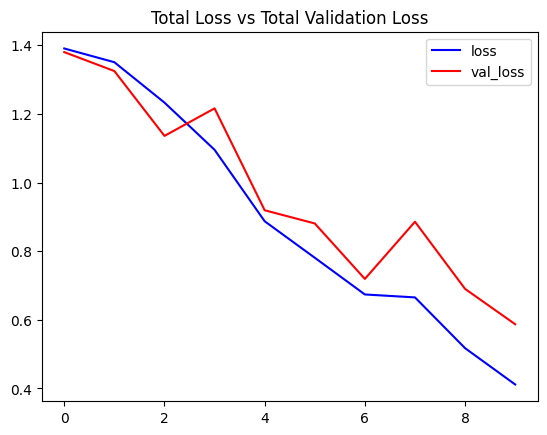

In [36]:
# Visualize the training and validation loss metrices.
plot_metric(LRCN_model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

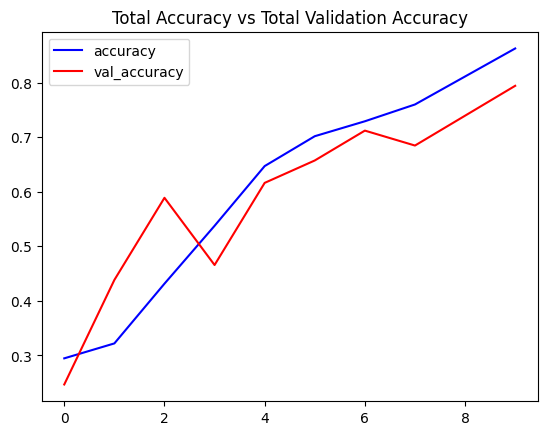

In [37]:
# Visualize the training and validation accuracy metrices.
plot_metric(LRCN_model_training_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

### Проверка моделей

Из результатов кажется, что модель LRCN значительно хорошо справилась с небольшим количеством классов. Поэтому на этом этапе мы проведем тестирование модели LRCN на нескольких видеороликах с YouTube.

In [38]:
def download_youtube_videos(youtube_video_url, output_directory):
     '''
    This function downloads the youtube video whose URL is passed to it as an argument.
    Args:
        youtube_video_url: URL of the video that is required to be downloaded.
        output_directory:  The directory path to which the video needs to be stored after downloading.
    Returns:
        title: The title of the downloaded youtube video.
    '''

     # Create a video object which contains useful information about the video.
     video = pafy.new(youtube_video_url)

     # Retrieve the title of the video.
     title = video.title

     # Get the best available quality object for the video.
     video_best = video.getbest()

     # Construct the output file path.
     output_file_path = f'{output_directory}/{title}.mp4'

     # Download the youtube video at the best available quality and store it to the contructed path.
     video_best.download(filepath = output_file_path, quiet = True)

     # Return the video title.
     return title

In [30]:
%pip install youtube-dl

In [48]:
# Get the YouTube Video's path we just downloaded.
test_videos_directory = "test_videos"
video_title = "videoplayback"
input_video_file_path = f'{test_videos_directory}/{video_title}.mp4'

In [41]:
def predict_on_video(video_file_path, output_file_path, SEQUENCE_LENGTH):
    '''
    This function will perform action recognition on a video using the LRCN model.
    Args:
    video_file_path:  The path of the video stored in the disk on which the action recognition is to be performed.
    output_file_path: The path where the ouput video with the predicted action being performed overlayed will be stored.
    SEQUENCE_LENGTH:  The fixed number of frames of a video that can be passed to the model as one sequence.
    '''

    # Initialize the VideoCapture object to read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)

    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Initialize the VideoWriter Object to store the output video in the disk.
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'),
                                   video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))

    # Declare a queue to store video frames.
    frames_queue = deque(maxlen = SEQUENCE_LENGTH)

    # Initialize a variable to store the predicted action being performed in the video.
    predicted_class_name = ''

    # Iterate until the video is accessed successfully.
    while video_reader.isOpened():

        # Read the frame.
        ok, frame = video_reader.read()

        # Check if frame is not read properly then break the loop.
        if not ok:
            break

        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1.
        normalized_frame = resized_frame / 255

        # Appending the pre-processed frame into the frames list.
        frames_queue.append(normalized_frame)

        # Check if the number of frames in the queue are equal to the fixed sequence length.
        if len(frames_queue) == SEQUENCE_LENGTH:

            # Pass the normalized frames to the model and get the predicted probabilities.
            predicted_labels_probabilities = LRCN_model.predict(np.expand_dims(frames_queue, axis = 0))[0]

            # Get the index of class with highest probability.
            predicted_label = np.argmax(predicted_labels_probabilities)

            # Get the class name using the retrieved index.
            predicted_class_name = CLASSES_LIST[predicted_label]

        # Write predicted class name on top of the frame.
        cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

        # Write The frame into the disk using the VideoWriter Object.
        video_writer.write(frame)

    # Release the VideoCapture and VideoWriter objects.
    video_reader.release()
    video_writer.release()

In [49]:
# Construct the output video path.
output_video_file_path = f'{test_videos_directory}/{video_title}-Output-SeqLen{SEQUENCE_LENGTH}.mp4'

# Perform Action Recognition on the Test Video.
predict_on_video(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Display the output video.
VideoFileClip(output_video_file_path, audio=False, target_resolution=(300,None))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━

In [43]:
def predict_single_action(video_file_path, SEQUENCE_LENGTH):
    '''
    This function will perform single action recognition prediction on a video using the LRCN model.
    Args:
    video_file_path:  The path of the video stored in the disk on which the action recognition is to be performed.
    SEQUENCE_LENGTH:  The fixed number of frames of a video that can be passed to the model as one sequence.
    '''

    # Initialize the VideoCapture object to read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)

    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Declare a list to store video frames we will extract.
    frames_list = []

    # Initialize a variable to store the predicted action being performed in the video.
    predicted_class_name = ''

    # Get the number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)

    # Iterating the number of times equal to the fixed length of sequence.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Read a frame.
        success, frame = video_reader.read()

        # Check if frame is not read properly then break the loop.
        if not success:
            break

        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1.
        normalized_frame = resized_frame / 255

        # Appending the pre-processed frame into the frames list
        frames_list.append(normalized_frame)

    # Passing the  pre-processed frames to the model and get the predicted probabilities.
    predicted_labels_probabilities = LRCN_model.predict(np.expand_dims(frames_list, axis = 0))[0]

    # Get the index of class with highest probability.
    predicted_label = np.argmax(predicted_labels_probabilities)

    # Get the class name using the retrieved index.
    predicted_class_name = CLASSES_LIST[predicted_label]

    # Display the predicted action along with the prediction confidence.
    print(f'Action Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')

    # Release the VideoCapture object.
    video_reader.release()

In [47]:
# Download the youtube video.
#video_title = download_youtube_videos('https://youtu.be/fc3w827kwyA', test_videos_directory)

# Construct tihe nput youtube video path
input_video_file_path = f'test_videos/Comparison Of Four Styles Of Tai Chi.mp4'

# Perform Single Prediction on the Test Video.
predict_single_action(input_video_file_path, SEQUENCE_LENGTH)

# Display the input video.
VideoFileClip(input_video_file_path, audio=False, target_resolution=(300,None))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Action Predicted: TaiChi
Confidence: 0.6314339637756348


## Использование LSTM для Action Recognition (сенсорные данные)

Распознавание человеческой деятельности (HAR) с использованием набора данных
смартфонов и LSTM. Классификация типа движения по шести категориям:
- WALKING,
- WALKING_UPSTAIRS,
- WALKING_DOWNSTAIRS,
- SITTING,
- STANDING,
- LAYING.


### Описание датасета:

Будут использоваться данные (мобильного телефона, прикрепленного к поясу), чтобы распознать тип активности, которую выполняет пользователь. Описание набора данных выглядит следующим образом:

Сигналы сенсоров (акселерометра и гироскопа) были предварительно обработаны путем применения фильтров шума, а затем отбирались в окна фиксированной ширины со скользящим окном в 2,56 секунды и перекрытием в 50% (128 измерений/окно). Сигнал ускорения сенсора, который имеет составляющие гравитации и движения тела, был разделен с помощью фильтра нижних частот Баттерворта на ускорение тела и гравитацию. Предполагается, что гравитационная сила имеет только низкочастотные компоненты, поэтому был использован фильтр с частотой среза 0,3 Гц.

Из акселерометра был отфильтрован только гравитационный эффект в качестве предварительного этапа для другой 3D-характеристики в качестве входных данных для обучения.

In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import tensorflow as tf  # Version 1.0.0 (some previous versions are used in past commits)
from sklearn import metrics

import os

2024-04-25 21:53:16.805159: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-25 21:53:16.826058: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-25 21:53:16.826077: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-25 21:53:16.826650: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-25 21:53:16.830646: I tensorflow/core/platform/cpu_feature_guar

Необходимо загрузить данные с помощью скрипта ```download_dataset.py```

In [16]:
!python download_dataset.py

python: can't open file '/home/student1/PatternsDetection/lecture8/download_dataset.py': [Errno 2] No such file or directory


In [2]:
# Полезные константы

# Это отдельные нормализованные входные характеристики для нейронной сети
INPUT_SIGNAL_TYPES = [
    "body_acc_x_",
    "body_acc_y_",
    "body_acc_z_",
    "body_gyro_x_",
    "body_gyro_y_",
    "body_gyro_z_",
    "total_acc_x_",
    "total_acc_y_",
    "total_acc_z_"
]

# Выходные классы, которые нужно научиться классифицировать
LABELS = [
    "WALKING",
    "WALKING_UPSTAIRS",
    "WALKING_DOWNSTAIRS",
    "SITTING",
    "STANDING",
    "LAYING"
]


### Подготовка датасета:

In [3]:
DATASET_PATH = "dataset/UCI HAR Dataset/"

In [4]:
TRAIN = "train/"
TEST = "test/"


def load_X(X_signals_paths):
    X_signals = []

    for signal_type_path in X_signals_paths:
        file = open(signal_type_path, 'r')
        X_signals.append(
            [np.array(serie, dtype=np.float32) for serie in [
                row.replace('  ', ' ').strip().split(' ') for row in file
            ]]
        )
        file.close()

    return np.transpose(np.array(X_signals), (1, 2, 0))

X_train_signals_paths = [
    DATASET_PATH + TRAIN + "Inertial_Signals/" + signal + "train.txt" for signal in INPUT_SIGNAL_TYPES
]
X_test_signals_paths = [
    DATASET_PATH + TEST + "Inertial_Signals/" + signal + "test.txt" for signal in INPUT_SIGNAL_TYPES
]

X_train = load_X(X_train_signals_paths)
X_test = load_X(X_test_signals_paths)



def load_y(y_path):
    file = open(y_path, 'r')
    y_ = np.array(
        [elem for elem in [
            row.replace('  ', ' ').strip().split(' ') for row in file
        ]],
        dtype=np.int32
    )
    file.close()

    return y_ - 1

y_train_path = DATASET_PATH + TRAIN + "y_train.txt"
y_test_path = DATASET_PATH + TEST + "y_test.txt"

y_train = load_y(y_train_path)
y_test = load_y(y_test_path)


### Дополнительные параметры:

Здесь определяем несколько ключевых параметров для обучения.

Например, структура всей нейронной сети может быть кратко описана путем перечисления этих параметров и факта использования двух LSTM, расположенных один над другим (стекованных), с передачей вывода на вход в качестве скрытых слоев через timesteps.

In [6]:
# Input Data

training_data_count = len(X_train)  # 7352
test_data_count = len(X_test)  # 2947
n_steps = len(X_train[0])  # 128 timesteps
n_input = len(X_train[0][0])  # 9


# LSTM Neural Network's internal structure

n_hidden = 32 # Hidden layer num of features
n_classes = 6 # Total classes (should go up, or should go down)


# Training

learning_rate = 0.0025
lambda_loss_amount = 0.0015
training_iters = training_data_count * 300  # Loop 300 times on the dataset
batch_size = 1500
display_iter = 30000  # To show test set accuracy during training


# Some debugging info

print("Некоторая полезная информация для получения представления о форме набора данных и нормализации:")
print("(X shape, y shape, среднее каждого X, стандартное отклонение каждого X)")
print(X_test.shape, y_test.shape, np.mean(X_test), np.std(X_test))
print("Таким образом, набор данных правильно нормализован, как ожидалось, но еще не преобразован в one-hot кодировку.")


Некоторая полезная информация для получения представления о форме набора данных и нормализации:
(X shape, y shape, среднее каждого X, стандартное отклонение каждого X)
(2947, 128, 9) (2947, 1) 0.09913992 0.39567086
Таким образом, набор данных правильно нормализован, как ожидалось, но еще не преобразован в one-hot кодировку.


### Определяем функции для обучения:

In [7]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

Instructions for updating:
non-resource variables are not supported in the long term


In [8]:
def LSTM_RNN(_X, _weights, _biases):
    # Функция возвращает искусственную нейронную сеть LSTM (RNN) TensorFlow с заданными параметрами.
    # Кроме того, используются две стекированные LSTM ячейки, что добавляет глубину нейронной сети.

    # (Этот шаг можно существенно оптимизировать преобразованием выборки)
    # input shape: (batch_size, n_steps, n_input)
    _X = tf.transpose(_X, [1, 0, 2])  # permute n_steps and batch_size
    # Преобразование для подготовки входных значений к скрытому слою (hidden activation)
    _X = tf.reshape(_X, [-1, n_input])
    # new shape: (n_steps*batch_size, n_input)

    # ReLU activation:
    _X = tf.nn.relu(tf.matmul(_X, _weights['hidden']) + _biases['hidden'])
    # Разделение данных, поскольку ячейка RNN требует список входных данных
    # для внутреннего цикла RNN
    _X = tf.split(_X, n_steps, 0)
    # new shape: n_steps * (batch_size, n_hidden)

    # определение ячеек LSTM (two recurrent layers deep)
    lstm_cell_1 = tf.nn.rnn_cell.BasicLSTMCell(n_hidden, forget_bias=1.0, state_is_tuple=True)
    lstm_cell_2 = tf.nn.rnn_cell.BasicLSTMCell(n_hidden, forget_bias=1.0, state_is_tuple=True)
    lstm_cells = tf.nn.rnn_cell.MultiRNNCell([lstm_cell_1, lstm_cell_2], state_is_tuple=True)
    # Получение выхода ячейки LSTM
    outputs, states = tf.nn.static_rnn(lstm_cells, _X, dtype=tf.float32)
    lstm_last_output = outputs[-1]

    return tf.matmul(lstm_last_output, _weights['out']) + _biases['out']


def extract_batch_size(_train, step, batch_size):
    # Function to fetch a "batch_size" amount of data from "(X|y)_train" data.
    shape = list(_train.shape)
    shape[0] = batch_size
    batch_s = np.empty(shape)

    for i in range(batch_size):
        index = ((step - 1) * batch_size + i) % len(_train)
        batch_s[i] = _train[index]

    return batch_s


def one_hot(y_, n_classes=n_classes):
    y_ = y_.reshape(len(y_))
    return np.eye(n_classes)[np.array(y_, dtype=np.int32)]


In [9]:
# Graph input/output
x = tf.placeholder(tf.float32, [None, n_steps, n_input])
y = tf.placeholder(tf.float32, [None, n_classes])

# Graph weights
weights = {
    'hidden': tf.Variable(tf.random_normal([n_input, n_hidden])), # Hidden layer weights
    'out': tf.Variable(tf.random_normal([n_hidden, n_classes], mean=1.0))
}
biases = {
    'hidden': tf.Variable(tf.random_normal([n_hidden])),
    'out': tf.Variable(tf.random_normal([n_classes]))
}

pred = LSTM_RNN(x, weights, biases)

# Loss, optimizer and evaluation
l2 = lambda_loss_amount * sum(
    tf.nn.l2_loss(tf_var) for tf_var in tf.trainable_variables()
) # L2 loss prevents this overkill neural network to overfit the data
cost = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels=y, logits=pred)) + l2 # Softmax loss
optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(cost) # Adam Optimizer

correct_pred = tf.equal(tf.argmax(pred,1), tf.argmax(y,1))
accuracy = tf.reduce_mean(tf.cast(correct_pred, tf.float32))


Instructions for updating:
Please use `keras.layers.RNN(cell, unroll=True)`, which is equivalent to this API
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


/tmp/ipykernel_122689/3002030638.py:20: UserWarning: `tf.nn.rnn_cell.BasicLSTMCell` is deprecated and will be removed in a future version. This class is equivalent as `tf.keras.layers.LSTMCell`, and will be replaced by that in Tensorflow 2.0.
  lstm_cell_1 = tf.nn.rnn_cell.BasicLSTMCell(n_hidden, forget_bias=1.0, state_is_tuple=True)
/tmp/ipykernel_122689/3002030638.py:21: UserWarning: `tf.nn.rnn_cell.BasicLSTMCell` is deprecated and will be removed in a future version. This class is equivalent as `tf.keras.layers.LSTMCell`, and will be replaced by that in Tensorflow 2.0.
  lstm_cell_2 = tf.nn.rnn_cell.BasicLSTMCell(n_hidden, forget_bias=1.0, state_is_tuple=True)


Instructions for updating:

Future major versions of TensorFlow will allow gradients to flow
into the labels input on backprop by default.

See `tf.nn.softmax_cross_entropy_with_logits_v2`.



In [58]:
%pip install tensorflow==2.15.0
%pip install keras==2.15.0

  Using cached tensorflow-2.15.0-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (4.4 kB)
  Using cached ml_dtypes-0.2.0-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
  Using cached wrapt-1.14.1-cp39-cp39-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (6.7 kB)
  Using cached tensorboard-2.15.2-py3-none-any.whl.metadata (1.7 kB)
  Using cached tensorflow_estimator-2.15.0-py2.py3-none-any.whl.metadata (1.3 kB)
  Using cached google_auth-2.29.0-py2.py3-none-any.whl.metadata (4.7 kB)
  Using cached google_auth_oauthlib-1.2.0-py2.py3-none-any.whl.metadata (2.7 kB)
  Using cached cachetools-5.3.3-py3-none-any.whl.metadata (5.3 kB)
  Using cached pyasn1_modules-0.4.0-py3-none-any.whl.metadata (3.4 kB)
  Using cached rsa-4.9-py3-none-any.whl.metadata (4.2 kB)
  Using cached requests_oauthlib-2.0.0-py2.py3-none-any.whl.metadata (11 kB)
  Using cached pyasn1-0.6.0-py2.py3-none-any.whl.metadata (8.3 kB)


In [10]:
# To keep track of training's performance
test_losses = []
test_accuracies = []
train_losses = []
train_accuracies = []

# Launch the graph
sess = tf.InteractiveSession(config=tf.ConfigProto(log_device_placement=True))
init = tf.global_variables_initializer()
sess.run(init)

# Perform Training steps with "batch_size" amount of example data at each loop
step = 1
while step * batch_size <= training_iters:
    batch_xs =         extract_batch_size(X_train, step, batch_size)
    batch_ys = one_hot(extract_batch_size(y_train, step, batch_size))

    # Fit training using batch data
    _, loss, acc = sess.run(
        [optimizer, cost, accuracy],
        feed_dict={
            x: batch_xs,
            y: batch_ys
        }
    )
    train_losses.append(loss)
    train_accuracies.append(acc)

    # Evaluate network only at some steps for faster training:
    if (step*batch_size % display_iter == 0) or (step == 1) or (step * batch_size > training_iters):

        # To not spam console, show training accuracy/loss in this "if"
        print("Training iter #" + str(step*batch_size) + \
              ":   Batch Loss = " + "{:.6f}".format(loss) + \
              ", Accuracy = {}".format(acc))

        # Evaluation on the test set (no learning made here - just evaluation for diagnosis)
        loss, acc = sess.run(
            [cost, accuracy],
            feed_dict={
                x: X_test,
                y: one_hot(y_test)
            }
        )
        test_losses.append(loss)
        test_accuracies.append(acc)
        print("PERFORMANCE ON TEST SET: " + \
              "Batch Loss = {}".format(loss) + \
              ", Accuracy = {}".format(acc))

    step += 1

print("Оптимизация завершена!")


Device mapping:
/job:localhost/replica:0/task:0/device:GPU:0 -> device: 0, name: NVIDIA GeForce RTX 3070, pci bus id: 0000:01:00.0, compute capability: 8.6



2024-04-25 21:53:42.164320: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-25 21:53:42.187356: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-25 21:53:42.187501: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

random_normal/RandomStandardNormal: (RandomStandardNormal): /job:localhost/replica:0/task:0/device:GPU:0
random_normal/mul: (Mul): /job:localhost/replica:0/task:0/device:GPU:0
random_normal: (AddV2): /job:localhost/replica:0/task:0/device:GPU:0
Variable: (VariableV2): /job:localhost/replica:0/task:0/device:GPU:0
Variable/Assign: (Assign): /job:localhost/replica:0/task:0/device:GPU:0
random_normal_1/RandomStandardNormal: (RandomStandardNormal): /job:localhost/replica:0/task:0/device:GPU:0
random_normal_1/mul: (Mul): /job:localhost/replica:0/task:0/device:GPU:0
random_normal_1: (AddV2): /job:localhost/replica:0/task:0/device:GPU:0
Variable_1: (VariableV2): /job:localhost/replica:0/task:0/device:GPU:0
Variable_1/Assign: (Assign): /job:localhost/replica:0/task:0/device:GPU:0
random_normal_2/RandomStandardNormal: (RandomStandardNormal): /job:localhost/replica:0/task:0/device:GPU:0
random_normal_2/mul: (Mul): /job:localhost/replica:0/task:0/device:GPU:0
random_normal_2: (AddV2): /job:localho

2024-04-25 21:53:42.565989: I tensorflow/core/common_runtime/placer.cc:125] Variable: (VariableV2): /job:localhost/replica:0/task:0/device:GPU:0
2024-04-25 21:53:42.566028: I tensorflow/core/common_runtime/placer.cc:125] Variable/read: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
2024-04-25 21:53:42.566031: I tensorflow/core/common_runtime/placer.cc:125] Variable_1: (VariableV2): /job:localhost/replica:0/task:0/device:GPU:0
2024-04-25 21:53:42.566034: I tensorflow/core/common_runtime/placer.cc:125] Variable_1/read: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
2024-04-25 21:53:42.566036: I tensorflow/core/common_runtime/placer.cc:125] Variable_2: (VariableV2): /job:localhost/replica:0/task:0/device:GPU:0
2024-04-25 21:53:42.566038: I tensorflow/core/common_runtime/placer.cc:125] Variable_2/read: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
2024-04-25 21:53:42.566042: I tensorflow/core/common_runtime/placer.cc:125] Variable_3: (VariableV2): /job:localh

Training iter #1500:   Batch Loss = 2.888683, Accuracy = 0.15666666626930237
Variable: (VariableV2): /job:localhost/replica:0/task:0/device:GPU:0
Variable/read: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
Variable_1: (VariableV2): /job:localhost/replica:0/task:0/device:GPU:0
Variable_1/read: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
Variable_2: (VariableV2): /job:localhost/replica:0/task:0/device:GPU:0
Variable_2/read: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
Variable_3: (VariableV2): /job:localhost/replica:0/task:0/device:GPU:0
Variable_3/read: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
transpose: (Transpose): /job:localhost/replica:0/task:0/device:GPU:0
Reshape: (Reshape): /job:localhost/replica:0/task:0/device:GPU:0
MatMul: (MatMul): /job:localhost/replica:0/task:0/device:GPU:0
add: (AddV2): /job:localhost/replica:0/task:0/device:GPU:0
Relu: (Relu): /job:localhost/replica:0/task:0/device:GPU:0
split: (Split): /job:localhost/r

2024-04-25 21:53:43.439493: I tensorflow/core/common_runtime/placer.cc:125] Variable: (VariableV2): /job:localhost/replica:0/task:0/device:GPU:0
2024-04-25 21:53:43.439530: I tensorflow/core/common_runtime/placer.cc:125] Variable/read: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
2024-04-25 21:53:43.439533: I tensorflow/core/common_runtime/placer.cc:125] Variable_1: (VariableV2): /job:localhost/replica:0/task:0/device:GPU:0
2024-04-25 21:53:43.439535: I tensorflow/core/common_runtime/placer.cc:125] Variable_1/read: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
2024-04-25 21:53:43.439537: I tensorflow/core/common_runtime/placer.cc:125] Variable_2: (VariableV2): /job:localhost/replica:0/task:0/device:GPU:0
2024-04-25 21:53:43.439539: I tensorflow/core/common_runtime/placer.cc:125] Variable_2/read: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
2024-04-25 21:53:43.439554: I tensorflow/core/common_runtime/placer.cc:125] Variable_3: (VariableV2): /job:localh

Training iter #30000:   Batch Loss = 1.419804, Accuracy = 0.6913333535194397
PERFORMANCE ON TEST SET: Batch Loss = 1.5071383714675903, Accuracy = 0.6236851215362549
Training iter #60000:   Batch Loss = 1.019710, Accuracy = 0.8513333201408386
PERFORMANCE ON TEST SET: Batch Loss = 1.3172318935394287, Accuracy = 0.7441465854644775
Training iter #90000:   Batch Loss = 0.916308, Accuracy = 0.8759999871253967
PERFORMANCE ON TEST SET: Batch Loss = 1.2170219421386719, Accuracy = 0.7902952432632446
Training iter #120000:   Batch Loss = 0.964939, Accuracy = 0.8539999723434448
PERFORMANCE ON TEST SET: Batch Loss = 1.128511667251587, Accuracy = 0.8262640237808228
Training iter #150000:   Batch Loss = 0.704841, Accuracy = 0.9713333249092102
PERFORMANCE ON TEST SET: Batch Loss = 1.0720182657241821, Accuracy = 0.8466236591339111
Training iter #180000:   Batch Loss = 0.769464, Accuracy = 0.9066666960716248
PERFORMANCE ON TEST SET: Batch Loss = 1.0125020742416382, Accuracy = 0.8669833540916443
Training

In [11]:
# Accuracy for test data

one_hot_predictions, accuracy, final_loss = sess.run(
    [pred, accuracy, cost],
    feed_dict={
        x: X_test,
        y: one_hot(y_test)
    }
)

test_losses.append(final_loss)
test_accuracies.append(accuracy)

print("FINAL RESULT: " + \
      "Batch Loss = {}".format(final_loss) + \
      ", Accuracy = {}".format(accuracy))

Variable: (VariableV2): /job:localhost/replica:0/task:0/device:GPU:0
Variable/read: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
Variable_1: (VariableV2): /job:localhost/replica:0/task:0/device:GPU:0
Variable_1/read: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
Variable_2: (VariableV2): /job:localhost/replica:0/task:0/device:GPU:0
Variable_2/read: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
Variable_3: (VariableV2): /job:localhost/replica:0/task:0/device:GPU:0
Variable_3/read: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
transpose: (Transpose): /job:localhost/replica:0/task:0/device:GPU:0
Reshape: (Reshape): /job:localhost/replica:0/task:0/device:GPU:0
MatMul: (MatMul): /job:localhost/replica:0/task:0/device:GPU:0
add: (AddV2): /job:localhost/replica:0/task:0/device:GPU:0
Relu: (Relu): /job:localhost/replica:0/task:0/device:GPU:0
split: (Split): /job:localhost/replica:0/task:0/device:GPU:0
rnn/Shape: (Shape): /job:localhost/replica:0/tas

2024-04-25 21:59:56.363387: I tensorflow/core/common_runtime/placer.cc:125] Variable: (VariableV2): /job:localhost/replica:0/task:0/device:GPU:0
2024-04-25 21:59:56.363414: I tensorflow/core/common_runtime/placer.cc:125] Variable/read: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
2024-04-25 21:59:56.363418: I tensorflow/core/common_runtime/placer.cc:125] Variable_1: (VariableV2): /job:localhost/replica:0/task:0/device:GPU:0
2024-04-25 21:59:56.363422: I tensorflow/core/common_runtime/placer.cc:125] Variable_1/read: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
2024-04-25 21:59:56.363424: I tensorflow/core/common_runtime/placer.cc:125] Variable_2: (VariableV2): /job:localhost/replica:0/task:0/device:GPU:0
2024-04-25 21:59:56.363440: I tensorflow/core/common_runtime/placer.cc:125] Variable_2/read: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
2024-04-25 21:59:56.363443: I tensorflow/core/common_runtime/placer.cc:125] Variable_3: (VariableV2): /job:localh

### Результаты

In [12]:
import warnings
warnings.filterwarnings("ignore")

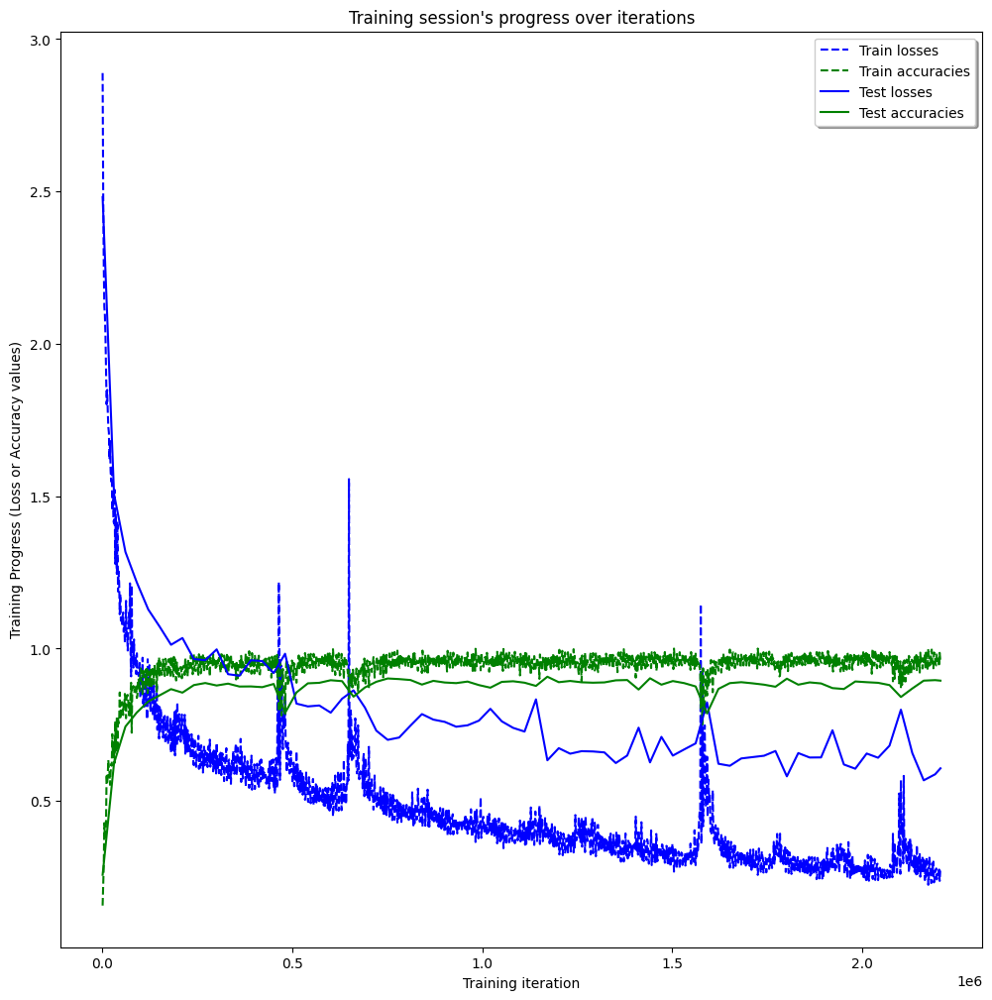

In [13]:
# (Inline plots: )
%matplotlib inline

width = 12
height = 12
plt.figure(figsize=(width, height))

indep_train_axis = np.array(range(batch_size, (len(train_losses)+1)*batch_size, batch_size))
plt.plot(indep_train_axis, np.array(train_losses),     "b--", label="Train losses")
plt.plot(indep_train_axis, np.array(train_accuracies), "g--", label="Train accuracies")

indep_test_axis = np.append(
    np.array(range(batch_size, len(test_losses)*display_iter, display_iter)[:-1]),
    [training_iters]
)
plt.plot(indep_test_axis, np.array(test_losses),     "b-", label="Test losses")
plt.plot(indep_test_axis, np.array(test_accuracies), "g-", label="Test accuracies")

plt.title("Training session's progress over iterations")
plt.legend(loc='upper right', shadow=True)
plt.ylabel('Training Progress (Loss or Accuracy values)')
plt.xlabel('Training iteration')

plt.show()

Testing Accuracy: 89.4808292388916%

Precision: 89.97736237241102%
Recall: 89.48082796063794%
f1_score: 89.55153104666267%

Confusion Matrix:
[[436  55   4   1   0   0]
 [ 16 450   5   0   0   0]
 [  5   6 409   0   0   0]
 [  2  26   0 400  63   0]
 [  1   5   0  94 432   0]
 [  0  27   0   0   0 510]]

Confusion matrix (normalised to % of total test data):
[[14.794705    1.8663046   0.13573125  0.03393281  0.          0.        ]
 [ 0.542925   15.269765    0.16966406  0.          0.          0.        ]
 [ 0.16966406  0.20359688 13.87852     0.          0.          0.        ]
 [ 0.06786563  0.88225317  0.         13.573125    2.137767    0.        ]
 [ 0.03393281  0.16966406  0.          3.1896844  14.658976    0.        ]
 [ 0.          0.916186    0.          0.          0.         17.305735  ]]
Note: training and testing data is not equally distributed amongst classes, 
so it is normal that more than a 6th of the data is correctly classifier in the last category.


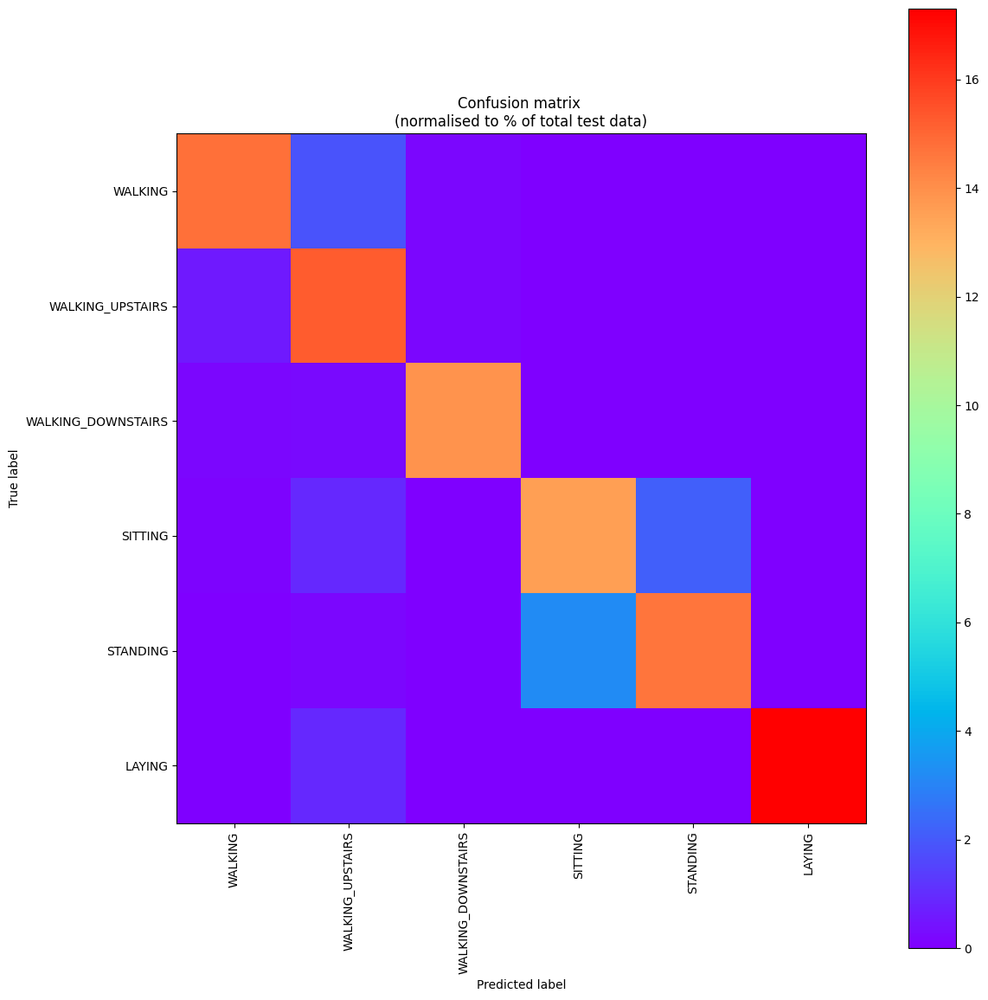

In [14]:
# Results

predictions = one_hot_predictions.argmax(1)

print("Testing Accuracy: {}%".format(100*accuracy))

print("")
print("Precision: {}%".format(100*metrics.precision_score(y_test, predictions, average="weighted")))
print("Recall: {}%".format(100*metrics.recall_score(y_test, predictions, average="weighted")))
print("f1_score: {}%".format(100*metrics.f1_score(y_test, predictions, average="weighted")))

print("")
print("Confusion Matrix:")
confusion_matrix = metrics.confusion_matrix(y_test, predictions)
print(confusion_matrix)
normalised_confusion_matrix = np.array(confusion_matrix, dtype=np.float32)/np.sum(confusion_matrix)*100

print("")
print("Confusion matrix (normalised to % of total test data):")
print(normalised_confusion_matrix)
print("Note: training and testing data is not equally distributed amongst classes, ")
print("so it is normal that more than a 6th of the data is correctly classifier in the last category.")

# Plot Results:
width = 12
height = 12
plt.figure(figsize=(width, height))
plt.imshow(
    normalised_confusion_matrix,
    interpolation='nearest',
    cmap=plt.cm.rainbow
)
plt.title("Confusion matrix \n(normalised to % of total test data)")
plt.colorbar()
tick_marks = np.arange(n_classes)
plt.xticks(tick_marks, LABELS, rotation=90)
plt.yticks(tick_marks, LABELS)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()